In [1]:
from os import listdir
import imgaug
import numpy as np
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray
import matplotlib.pyplot as plt
from mrcnn.utils import Dataset
from matplotlib import pyplot
from mrcnn.visualize import display_instances,draw_box
from mrcnn.utils import extract_bboxes

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

from mrcnn.config import Config
from mrcnn.model import MaskRCNN
import mrcnn.model as mrmodel
import warnings
import tensorflow as tf
import time
warnings.filterwarnings('ignore')
# gpu_available = tf.config.list_physical_devices('GPU')
gpu_available = tf.test.is_gpu_available()
gpu_available


2023-01-12 07:25:49.365969: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2023-01-12 07:25:49.890334: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-12 07:25:49.891041: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-01-12 07:25:49.891644: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-01-12 07:25:49.945577: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-12 07:2

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


2023-01-12 07:25:50.269280: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1261] Device interconnect StreamExecutor with strength 1 edge matrix:
2023-01-12 07:25:50.269305: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1267]      0 
2023-01-12 07:25:50.269311: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1280] 0:   N 
2023-01-12 07:25:50.269530: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-12 07:25:50.270014: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-12 07:25:50.270287: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-

True

 from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-12 07:25:50.275649: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1862] Adding visible gpu devices: 0
2023-01-12 07:25:50.275660: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1261] Device interconnect StreamExecutor with strength 1 edge matrix:
2023-01-12 07:25:50.275663: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1267]      0 
2023-01-12 07:25:50.275665: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1280] 0:   N 
2023-01-12 07:25:50.275694: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-12 07:25:50.275934: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
202

In [2]:
def check_mask_labels(masks):
    
    # Create an empty set
    unique_labels_len = set()
    
    # Iterate over all mask dataset
    for mask in masks:
        
        # Read mask
#         test_mask = io.imread(mask)
        test_mask = mask
        
        # Find unique labels in the mask
        unique_labels = np.unique(test_mask)
        
        # Find the total number of unique labels
        len_unique_labels = len(unique_labels)
        
        # Add to the set
        unique_labels_len.add(len_unique_labels)

    # Find the maximum label length
    max_label_len = max(unique_labels_len)
    
    # Convert to list and sort
    unique_labels_len = list(unique_labels_len)
    unique_labels_len.sort()
    
    # Print results
    print(f" Number of labels across all masks: {unique_labels_len} \n Maximum number of masks: {max_label_len}")

    return max_label_len

count = 0

In [3]:
class CornDataset(Dataset):
    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train=True):
#         start = time.perf_counter()
        # define classes
        self.add_class("dataset", 1, "fall-armyworm-larva")
        self.add_class("dataset", 2, "fall-armyworm-larval-damage")
        self.add_class("dataset", 3, "fall-armyworm-frass")
        self.add_class("dataset", 4, "fall-armyworm-egg")
        self.add_class("dataset", 5, "healthy-maize")
        self.add_class("dataset", 6, "maize-streak-disease")
        
        # define data locations
        images_dir = dataset_dir + '/images/'
        annotations_dir = dataset_dir + '/annots/'
       
             
    # find all images
        count = 1
        for filename in listdir(images_dir):
            print(filename)
			# extract image id
            image_id = filename[:-4]
            name1 = ''
            if filename[-4:] != 'jpeg':
                name1 = filename[:-4]
            else:
                name1 = filename[:-5]
            image_id = name1
			
			# skip all images after 115 if we are building the train set
            if is_train and int(image_id) >= 6770:
                continue
			# skip all images before 115 if we are building the test/val set
            if not is_train and  int(image_id) < 6770 :
                continue
                
            img_path = images_dir + filename
            ann_path = annotations_dir + image_id + '.xml'
			# add to dataset
            self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path, class_ids = [0,1,2,3,4,5,6])
#         stop = time.perf_counter()
#         print("time for load_dataset",(stop-start))

	# extract bounding boxes from an annotation file
    def extract_boxes(self, filename):
#         start = time.perf_counter()
		# load and parse the file
        tree = ElementTree.parse(filename)
		# get the root of the document
        root = tree.getroot()
		# extract each bounding box
        boxes = list()
        for box in root.findall('.//object'):
            name = box.find('name').text   #Add label name to the box list
            xmin = int(box.find('./bndbox/xmin').text)
            ymin = int(box.find('./bndbox/ymin').text)
            xmax = int(box.find('./bndbox/xmax').text)
            ymax = int(box.find('./bndbox/ymax').text)
            coors = [xmin, ymin, xmax, ymax, name]
            boxes.append(coors)
            
		# extract image dimensions
        width = int(root.find('.//size/width').text)
        height = int(root.find('.//size/height').text)
#         stop = time.perf_counter()
#         print("time for extract_boxes",(stop-start))
        return boxes, width, height

	# load the masks for an image
    def load_mask(self, image_id):
#         start = time.perf_counter()
		# get details of image
        info = self.image_info[image_id]
		# define box file location
        path = info['annotation']
        #return info, path
        
        
		# load XML
        boxes, w, h = self.extract_boxes(path)
		# create one array for all masks, each on a different channel
        masks = zeros([h, w, len(boxes)], dtype='uint8')
		# create masks
        class_ids = list()
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            
            
            # box[4] will have the name of the class 
            if box[4]=='fall-armyworm-larva':
                masks[row_s:row_e, col_s:col_e, i] = 1
                class_ids.append(self.class_names.index('fall-armyworm-larva'))
            elif box[4]=='fall-armyworm-larval-damage':
                masks[row_s:row_e, col_s:col_e, i] = 2
                class_ids.append(self.class_names.index('fall-armyworm-larval-damage'))
            elif box[4]=='fall-armyworm-frass':
                masks[row_s:row_e, col_s:col_e, i] = 3
                class_ids.append(self.class_names.index('fall-armyworm-frass'))
            elif box[4]=='fall-armyworm-egg':
                masks[row_s:row_e, col_s:col_e, i] = 4
                class_ids.append(self.class_names.index('fall-armyworm-egg'))
            elif box[4]=='healthy-maize' or box[4]=='﻿healthy-maize' or box[4]=='healthy-images' or box[4]=='none-healthy':
                masks[row_s:row_e, col_s:col_e, i] = 5
                class_ids.append(self.class_names.index('healthy-maize'))
            elif box[4]=='maize-streak-disease':
                masks[row_s:row_e, col_s:col_e, i] = 6
                class_ids.append(self.class_names.index('maize-streak-disease'))
          
    #         stop = time.perf_counter()
#         print("time for load_mask",(stop-start))
#         NUM_CLASSES = check_mask_labels(masks)
#         print(NUM_CLASSES)
        return masks, asarray(class_ids, dtype='int32')
        

	# load an image reference
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [4]:
dataset_dir='final_dataset/'
validset_dir = 'validation/'

In [5]:
train_set = CornDataset()
train_set.load_dataset(dataset_dir, is_train=True)
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

185.jpg
7089.jpg
4648.jpg
781.JPG
6414.JPG
2132.jpg
4521.JPG
5848.jpg
7797.jpg
5315.jpg
3960.jpg
192.jpg
4311.jpg
3122.jpg
7777.jpg
8376.jpg
5956.jpeg
6844.jpg
625.jpg
7595.JPG
1447.jpg
3506.jpg
331.jpg
86.jpg
7020.jpg
6203.jpg
6959.jpg
2261.jpg
7942.jpg
5721.jpg
786.jpg
7698.jpg
3943.jpg
7928.jpg
6350.jpg
3370.jpg
5039.jpg
7844.jpg
8244.jpg
4385.jpg
7762.jpg
2638.jpeg
1887.jpg
3210.jpg
7140.jpg
2545.jpg
5032.jpg
7563.jpg
7157.JPG
4473.jpg
5386.jpg
7929.JPG
6835.jpg
4919.jpg
5015.jpg
2727.jpg
4420.jpg
6913.jpg
4984.jpg
3156.jpg
1788.jpeg
7786.jpg
6167.jpg
1443.jpg
675.jpg
4021.jpg
649.jpg
3014.jpg
7638.jpeg
7307.jpg
3182.jpg
265.jpeg
6933.jpg
5776.jpg
4848.jpg
3512.jpg
2431.jpg
2692.jpg
4025.jpg
117.jpg
7733.jpg
7645.jpg
5772.jpg
2873.jpg
3017.jpg
5110.jpg
7261.jpg
8165.JPG
5086.jpg
6278.jpg
5167.jpg
2926.jpg
4963.jpg
267.jpg
7922.jpg
388.jpg
2085.jpg
6088.jpg
5788.jpg
2523.jpg
4471.jpg
986.jpg
7948.jpg
7103.jpg
4605.jpg
3971.jpg
3643.jpg
149.jpeg
1647.jpg
2354.jpg
3661.jpg
1889.jpg
80

In [6]:
# test/val set
test_set = CornDataset()
test_set.load_dataset(dataset_dir, is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

185.jpg
7089.jpg
4648.jpg
781.JPG
6414.JPG
2132.jpg
4521.JPG
5848.jpg
7797.jpg
5315.jpg
3960.jpg
192.jpg
4311.jpg
3122.jpg
7777.jpg
8376.jpg
5956.jpeg
6844.jpg
625.jpg
7595.JPG
1447.jpg
3506.jpg
331.jpg
86.jpg
7020.jpg
6203.jpg
6959.jpg
2261.jpg
7942.jpg
5721.jpg
786.jpg
7698.jpg
3943.jpg
7928.jpg
6350.jpg
3370.jpg
5039.jpg
7844.jpg
8244.jpg
4385.jpg
7762.jpg
2638.jpeg
1887.jpg
3210.jpg
7140.jpg
2545.jpg
5032.jpg
7563.jpg
7157.JPG
4473.jpg
5386.jpg
7929.JPG
6835.jpg
4919.jpg
5015.jpg
2727.jpg
4420.jpg
6913.jpg
4984.jpg
3156.jpg
1788.jpeg
7786.jpg
6167.jpg
1443.jpg
675.jpg
4021.jpg
649.jpg
3014.jpg
7638.jpeg
7307.jpg
3182.jpg
265.jpeg
6933.jpg
5776.jpg
4848.jpg
3512.jpg
2431.jpg
2692.jpg
4025.jpg
117.jpg
7733.jpg
7645.jpg
5772.jpg
2873.jpg
3017.jpg
5110.jpg
7261.jpg
8165.JPG
5086.jpg
6278.jpg
5167.jpg
2926.jpg
4963.jpg
267.jpg
7922.jpg
388.jpg
2085.jpg
6088.jpg
5788.jpg
2523.jpg
4471.jpg
986.jpg
7948.jpg
7103.jpg
4605.jpg
3971.jpg
3643.jpg
149.jpeg
1647.jpg
2354.jpg
3661.jpg
1889.jpg
80

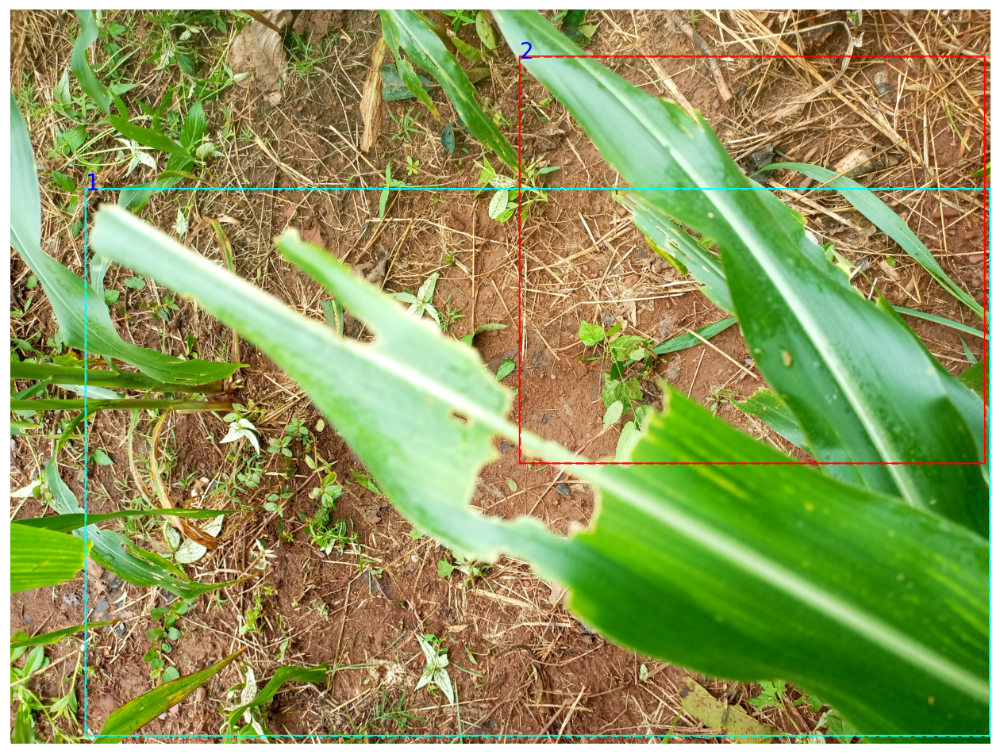

In [7]:
import random
num=random.randint(0, len(train_set.image_ids))
# define image id
image_id = num
# load the image
image = train_set.load_image(image_id)
# load the masks and the class ids
mask, class_ids = train_set.load_mask(image_id)
# extract bounding boxes from the masks
bbox = extract_bboxes(mask)
nums = [i+1 for i in range(len(class_ids))]
# display image with masks and bounding boxes
display_instances(image, bbox, mask, class_ids, train_set.class_names,captions=nums)
# display_instances(image, bbox, mask, class_ids, nums)

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


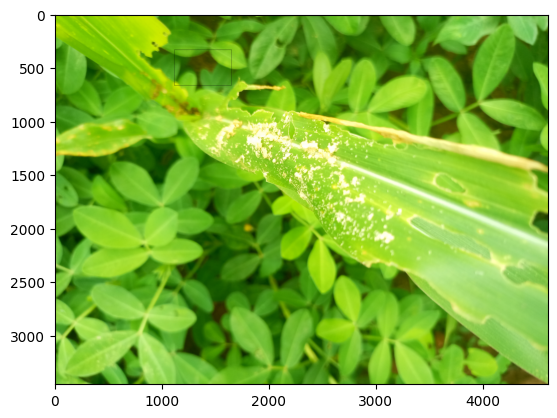

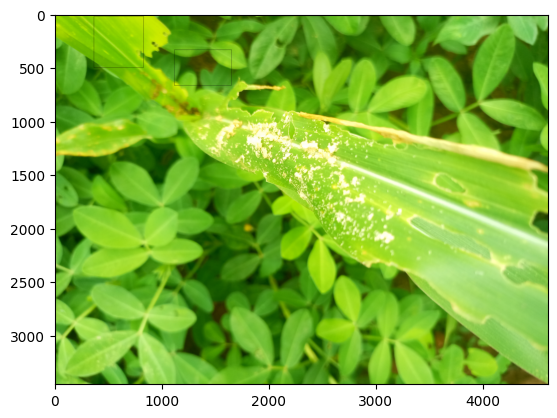

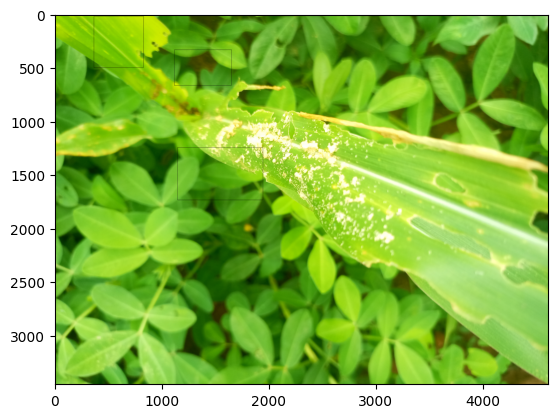

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


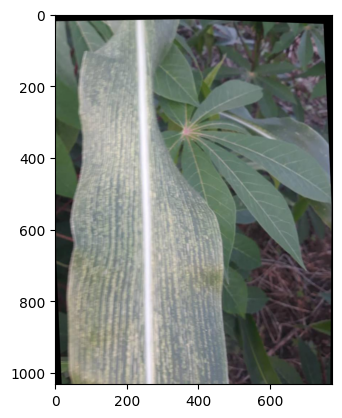

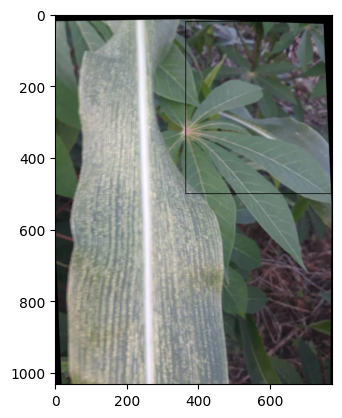

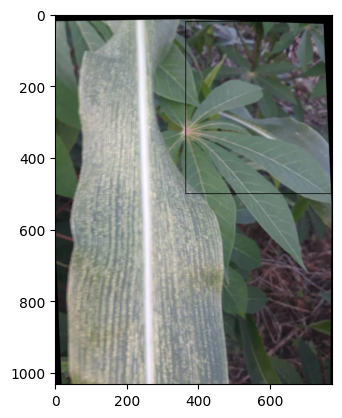

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


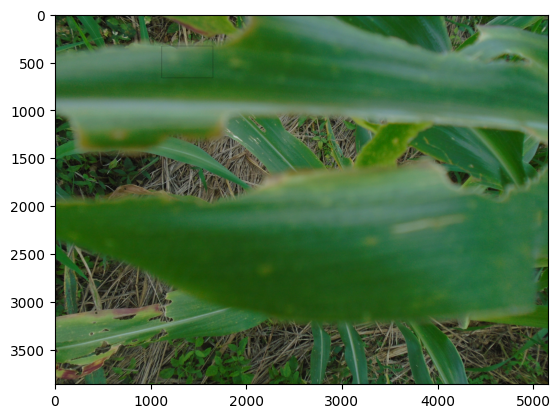

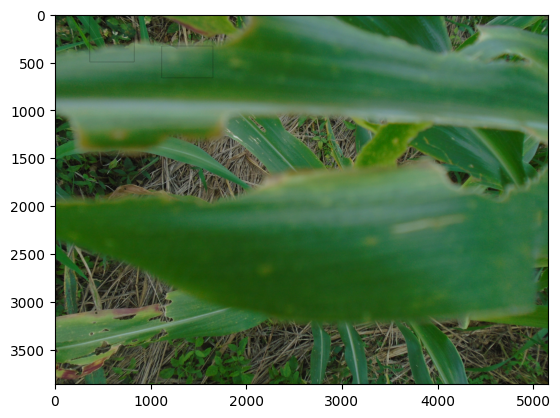

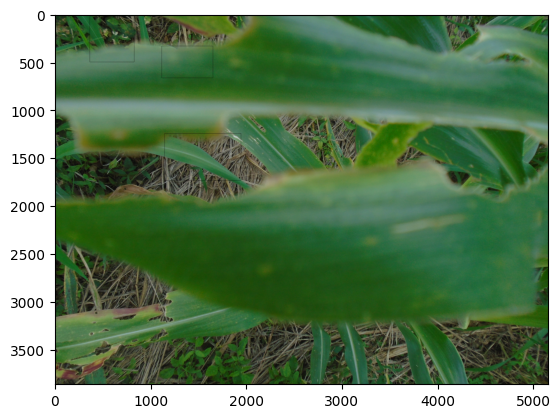

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


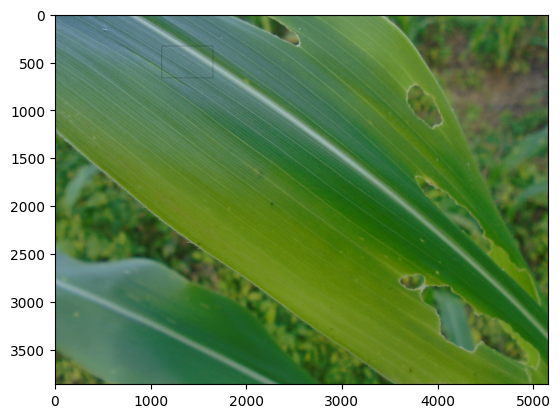

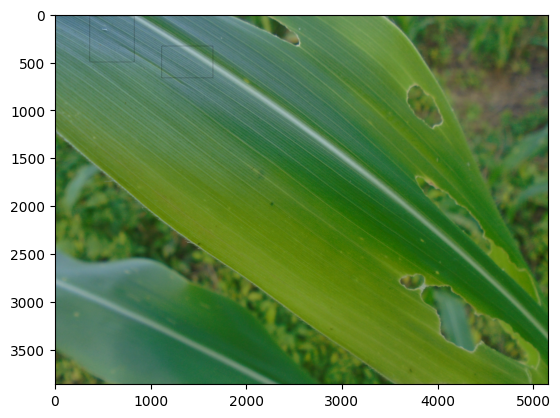

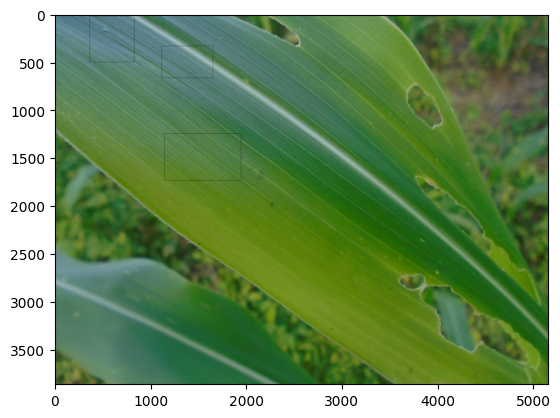

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


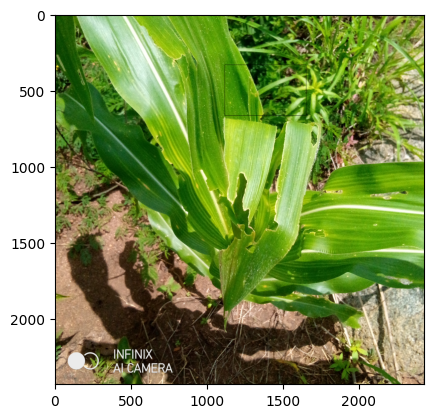

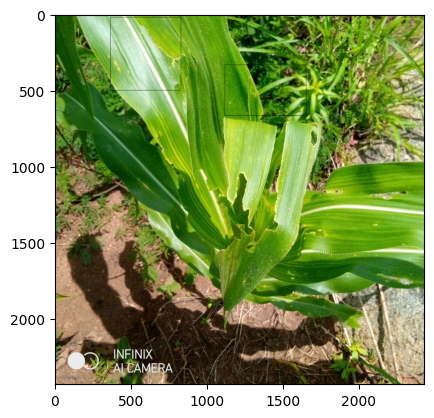

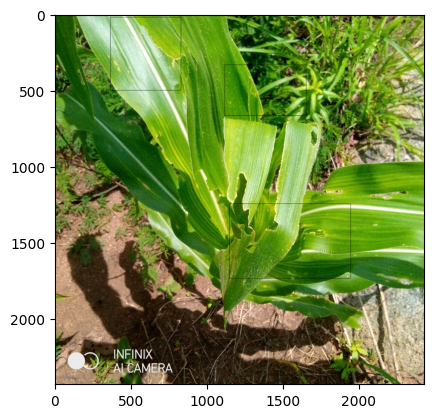

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


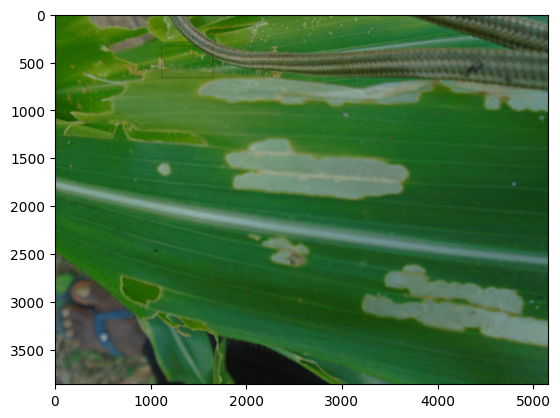

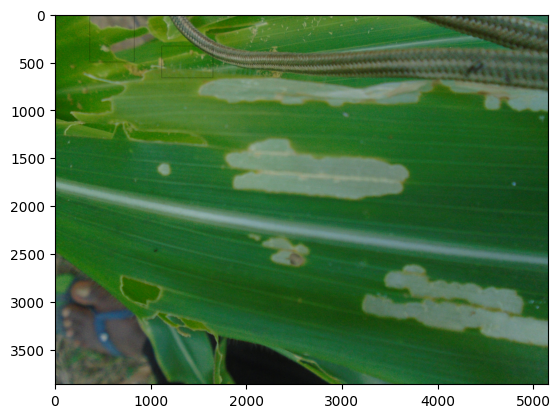

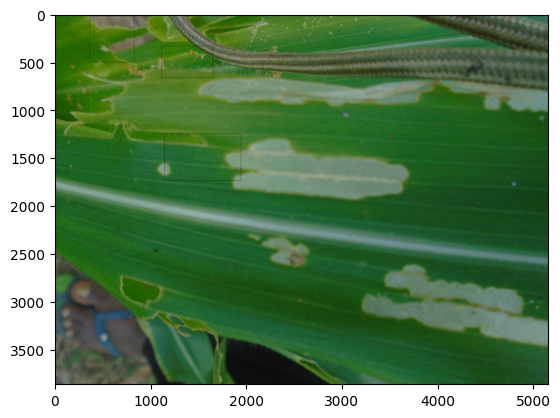

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


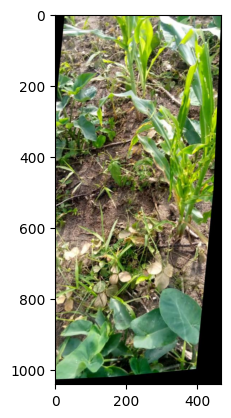

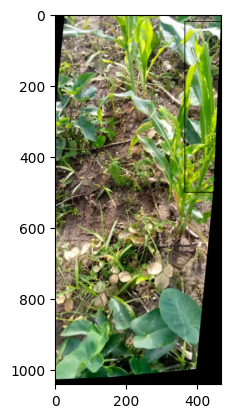

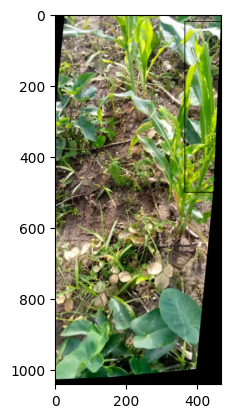

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


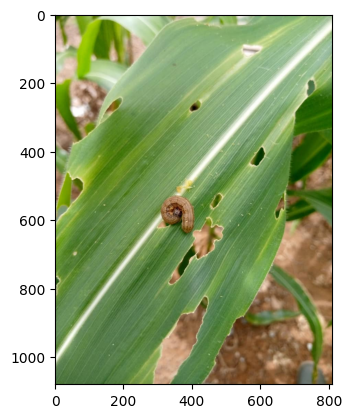

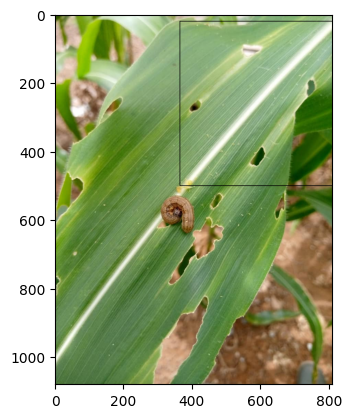

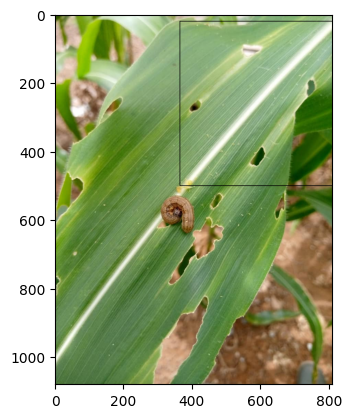

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


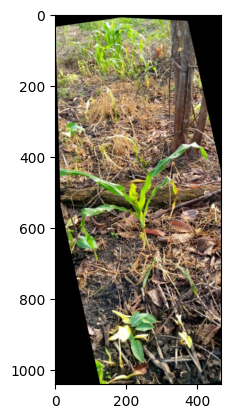

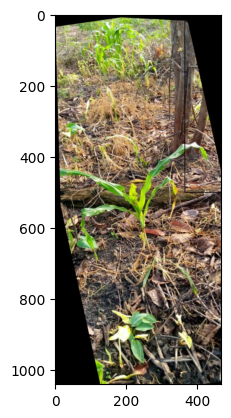

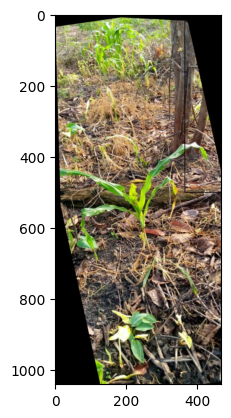

[[ 333 1115  666 1650]
 [  20  363  500  827]
 [1246 1145 1736 1943]]


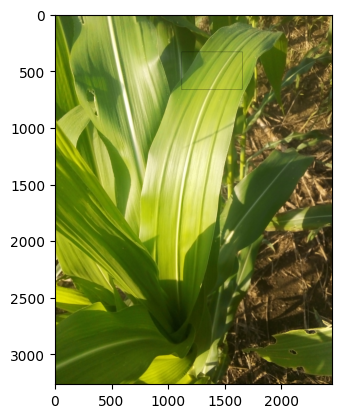

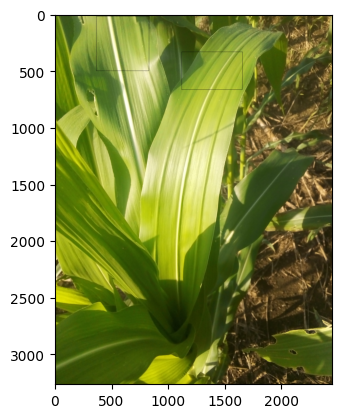

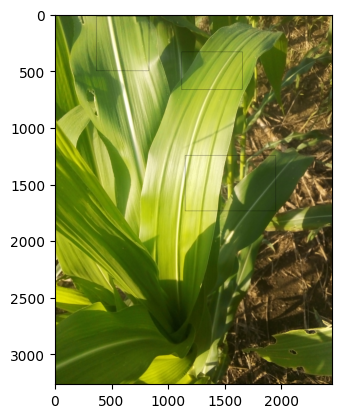

In [12]:
# for imgs in train_set.image_ids[:10]:
#     image_load =  train_set.load_image(imgs)
#     mask, class_ids = train_set.load_mask(image_id)
#     # extract bounding boxes from the masks
#     bbox = extract_bboxes(mask)
    

In [8]:
class CornConfig(Config):
    # define the name of the configuration
    NAME = "corn_cfg"
    # number of classes (background + 3 fruits)
    NUM_CLASSES = 1 + 6
    IMAGES_PER_GPU = 2
    # number of training steps per epoch
#     STEPS_PER_EPOCH = 30
    STEPS_PER_EPOCH = 300
    VALIDATION_STEPS = 50
    
     # Skip detections with < 90% confidence
#     DETECTION_MIN_CONFIDENCE = 0.8
    LEARNING_RATE = 0.001
#     BATCH_SIZE = 28
    
    

In [9]:
# prepare config
config = CornConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                19
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [10]:
import os
ROOT_DIR = "/home/mehathab/Desktop/maskrcnn_drY-run"
# Directory to save logs and trained model
DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")

In [11]:
# define the model
model = MaskRCNN(mode='training', model_dir=DEFAULT_LOGS_DIR, config=config)
model_inference = MaskRCNN(mode="inference", config=config, model_dir=DEFAULT_LOGS_DIR)

Instructions for updating:
Use fn_output_signature instead


In [12]:
# load weights (mscoco) and exclude the output layers
WEIGHT_PATH = 'mask_rcnn_coco.h5'
model.load_weights(WEIGHT_PATH, by_name=True,
                   exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])

2023-01-11 23:59:14.108607: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:196] None of the MLIR optimization passes are enabled (registered 0 passes)


In [13]:
# train weights (output layers or 'heads')
# history = model.train(train_set, test_set, learning_rate=config.LEARNING_RATE, epochs=100, layers='3+')

# mean_average_precision_callback = mrmodel.MeanAveragePrecisionCallback(model,
#                                                                         model_inference,
#                                                                         test_set,
#                                                                         calculate_map_at_every_X_epoch=5,
#                                                                         verbose=1)
history = model.train(train_set,test_set,
                learning_rate=config.LEARNING_RATE,
                epochs=50,
                layers='heads',)


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/mehathab/Desktop/maskrcnn_drY-run/logs/corn_cfg20230111T2359/mask_rcnn_corn_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)

2023-01-11 23:59:27.581517: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2023-01-11 23:59:27.913846: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2023-01-11 23:59:27.936951: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2023-01-11 23:59:29.329560: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2023-01-11 23:59:29.377109: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-01-11 23:59:30.232947: I tensorflow/stream_executor/cuda/cuda_blas.cc:1838] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.



  1/300 [..............................] - ETA: 3:56:14 - batch: 0.0000e+00 - size: 2.0000 - loss: 7.0441 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2573 - mrcnn_class_loss: 3.9977 - mrcnn_bbox_loss: 1.4181 - mrcnn_mask_loss: 1.2965

2023-01-12 00:00:13.739008: I tensorflow/core/profiler/lib/profiler_session.cc:136] Profiler session initializing.
2023-01-12 00:00:13.739030: I tensorflow/core/profiler/lib/profiler_session.cc:155] Profiler session started.
2023-01-12 00:00:13.739049: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1365] Profiler found 1 GPUs
2023-01-12 00:00:13.741776: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcupti.so.11.0



  2/300 [..............................] - ETA: 9:57 - batch: 0.5000 - size: 2.0000 - loss: 6.9259 - rpn_class_loss: 0.2609 - rpn_bbox_loss: 1.4071 - mrcnn_class_loss: 3.0726 - mrcnn_bbox_loss: 1.1224 - mrcnn_mask_loss: 1.0629       

2023-01-12 00:00:14.707931: I tensorflow/core/profiler/lib/profiler_session.cc:71] Profiler session collecting data.
2023-01-12 00:00:14.709051: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1487] CUPTI activity buffer flushed
2023-01-12 00:00:14.859296: I tensorflow/core/profiler/internal/gpu/cupti_collector.cc:228]  GpuTracer has collected 3227 callback api events and 3223 activity events. 
2023-01-12 00:00:14.890771: I tensorflow/core/profiler/lib/profiler_session.cc:172] Profiler session tear down.
2023-01-12 00:00:14.923166: I tensorflow/core/profiler/rpc/client/save_profile.cc:137] Creating directory: /home/mehathab/Desktop/maskrcnn_drY-run/logs/corn_cfg20230111T2359/plugins/profile/2023_01_12_00_00_14
2023-01-12 00:00:14.961197: I tensorflow/core/profiler/rpc/client/save_profile.cc:143] Dumped gzipped tool data for trace.json.gz to /home/mehathab/Desktop/maskrcnn_drY-run/logs/corn_cfg20230111T2359/plugins/profile/2023_01_12_00_00_14/mehathab-B660M.trace.json.gz
2023-01

300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 2.4447 - rpn_class_loss: 0.1886 - rpn_bbox_loss: 0.6071 - mrcnn_class_loss: 0.5483 - mrcnn_bbox_loss: 0.6519 - mrcnn_mask_loss: 0.4488
Epoch 00001: val_loss improved from inf to 2.30314, saving model to /home/mehathab/Desktop/maskrcnn_drY-run/logs/corn_cfg20230111T2359/mask_rcnn_corn_cfg_0001.h5
300/300 [==============================] - 458s 1s/step - batch: 149.5000 - size: 2.0000 - loss: 2.4447 - rpn_class_loss: 0.1886 - rpn_bbox_loss: 0.6071 - mrcnn_class_loss: 0.5483 - mrcnn_bbox_loss: 0.6519 - mrcnn_mask_loss: 0.4488 - val_loss: 2.3031 - val_rpn_class_loss: 0.1685 - val_rpn_bbox_loss: 0.5433 - val_mrcnn_class_loss: 0.5794 - val_mrcnn_bbox_loss: 0.5841 - val_mrcnn_mask_loss: 0.4279
Epoch 2/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 2.2273 - rpn_class_loss: 0.1552 - rpn_bbox_loss: 0.5780 - mrcnn_class_loss: 0.5170 - mrcnn_bbox_loss: 0.5619 

Epoch 24/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.8976 - rpn_class_loss: 0.1356 - rpn_bbox_loss: 0.5058 - mrcnn_class_loss: 0.4064 - mrcnn_bbox_loss: 0.4632 - mrcnn_mask_loss: 0.3867
Epoch 00024: val_loss did not improve from 1.85543
300/300 [==============================] - 386s 1s/step - batch: 149.5000 - size: 2.0000 - loss: 1.8976 - rpn_class_loss: 0.1356 - rpn_bbox_loss: 0.5058 - mrcnn_class_loss: 0.4064 - mrcnn_bbox_loss: 0.4632 - mrcnn_mask_loss: 0.3867 - val_loss: 1.9658 - val_rpn_class_loss: 0.1397 - val_rpn_bbox_loss: 0.4996 - val_mrcnn_class_loss: 0.4703 - val_mrcnn_bbox_loss: 0.4678 - val_mrcnn_mask_loss: 0.3884
Epoch 25/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.8608 - rpn_class_loss: 0.1285 - rpn_bbox_loss: 0.4824 - mrcnn_class_loss: 0.4136 - mrcnn_bbox_loss: 0.4518 - mrcnn_mask_loss: 0.3846
Epoch 00025: val_loss did not improve from 1.85543
300/300 [============

Epoch 36/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.7896 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.4795 - mrcnn_class_loss: 0.3958 - mrcnn_bbox_loss: 0.4280 - mrcnn_mask_loss: 0.3749
Epoch 00036: val_loss did not improve from 1.78338
300/300 [==============================] - 381s 1s/step - batch: 149.5000 - size: 2.0000 - loss: 1.7896 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.4795 - mrcnn_class_loss: 0.3958 - mrcnn_bbox_loss: 0.4280 - mrcnn_mask_loss: 0.3749 - val_loss: 1.8822 - val_rpn_class_loss: 0.1083 - val_rpn_bbox_loss: 0.4687 - val_mrcnn_class_loss: 0.4363 - val_mrcnn_bbox_loss: 0.4809 - val_mrcnn_mask_loss: 0.3880
Epoch 37/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.8225 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 0.4633 - mrcnn_class_loss: 0.4186 - mrcnn_bbox_loss: 0.4379 - mrcnn_mask_loss: 0.3827
Epoch 00037: val_loss did not improve from 1.78338
300/300 [============

Epoch 48/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.8062 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.4823 - mrcnn_class_loss: 0.3968 - mrcnn_bbox_loss: 0.4274 - mrcnn_mask_loss: 0.3799
Epoch 00048: val_loss did not improve from 1.75557
300/300 [==============================] - 395s 1s/step - batch: 149.5000 - size: 2.0000 - loss: 1.8062 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.4823 - mrcnn_class_loss: 0.3968 - mrcnn_bbox_loss: 0.4274 - mrcnn_mask_loss: 0.3799 - val_loss: 1.9085 - val_rpn_class_loss: 0.1261 - val_rpn_bbox_loss: 0.4606 - val_mrcnn_class_loss: 0.4577 - val_mrcnn_bbox_loss: 0.4853 - val_mrcnn_mask_loss: 0.3787
Epoch 49/50
300/300 [==============================] - ETA: 0s - batch: 149.5000 - size: 2.0000 - loss: 1.7549 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.4438 - mrcnn_class_loss: 0.3913 - mrcnn_bbox_loss: 0.4254 - mrcnn_mask_loss: 0.3786
Epoch 00049: val_loss did not improve from 1.75557
300/300 [============